Note: here are the links to see the results of each training session, conducted during this study of training yolov8s on custom dataset for gun detection:

Training 1: https://app.clear.ml/projects/0d634db2cdcb4793a77a8e38ffa98d12/experiments/cc01374b738848c8bc921b55621ee13e/output/execution
Training 2: https://app.clear.ml/projects/0d634db2cdcb4793a77a8e38ffa98d12/experiments/5d29005816aa45528a2e7d755ca05226/output/execution
Training 3: https://app.clear.ml/projects/0d634db2cdcb4793a77a8e38ffa98d12/experiments/5d29005816aa45528a2e7d755ca05226/output/execution
Training 4: https://app.clear.ml/projects/0d634db2cdcb4793a77a8e38ffa98d12/experiments/b4f37400236e404082c113261b7b64c8/output/execution

# Setup

Installing dependencies

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt comet_ml  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-245-g3d8f004 Python-3.10.12 torch-2.1.0+cu118 CPU


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 27.0/107.7 GB disk)


In [1]:
# Importing the dataset
!pip install roboflow
from roboflow import Roboflow
rf = Roboflow(api_key="HA6CUY3Vdt1sRtv6vmzQ")
project = rf.workspace("nizar-assad").project("pistols-lhjbh")
dataset = project.version(1642).download("yolov5")

You should consider upgrading via the 'C:\Users\assad\Desktop\weapon detection\venv\Scripts\python.exe -m pip install --upgrade pip' command.


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Pistols-1642 in yolov5pytorch:: 100%|██████████| 12910/12910 [00:07<00:00, 1775.75it/s]


We will use clearml, to assess our training sessions

In [ ]:
#@title Select YOLOv5 🚀 logger {run: 'auto'}
logger = 'ClearML' #@param ['Comet', 'ClearML', 'TensorBoard']

if logger == 'Comet':
  %pip install -q comet_ml
  import comet_ml; comet_ml.init()
elif logger == 'ClearML':
  %pip install -q clearml
  import clearml; clearml.browser_login()
elif logger == 'TensorBoard':
  %load_ext tensorboard
  %tensorboard --logdir runs/train

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 14.6 MB/s eta 0:00:00


<IPython.core.display.Javascript object>


🤖 ClearML connected successfully - let's build something! 🚀


In [ ]:
# Train YOLOv5s on the dataset
!python train.py --img 416 --batch 16 --epochs 50 --data {dataset.location}/data.yaml --cfg /content/yolov5/models/yolov5s.yaml --weights yolov5s.pt --name yolov5s_results  --cache


2023-11-23 05:20:17.044750: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-23 05:20:17.044829: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-23 05:20:17.044875: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=/content/yolov5/models/yolov5s.yaml, data=/content/yolov5/Pistols-1642/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single

In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
# Using an aternative method, to make sure ClearML charts are correct
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

Here we vizualise the validation batches to see how the model performed while training, the results are impresive

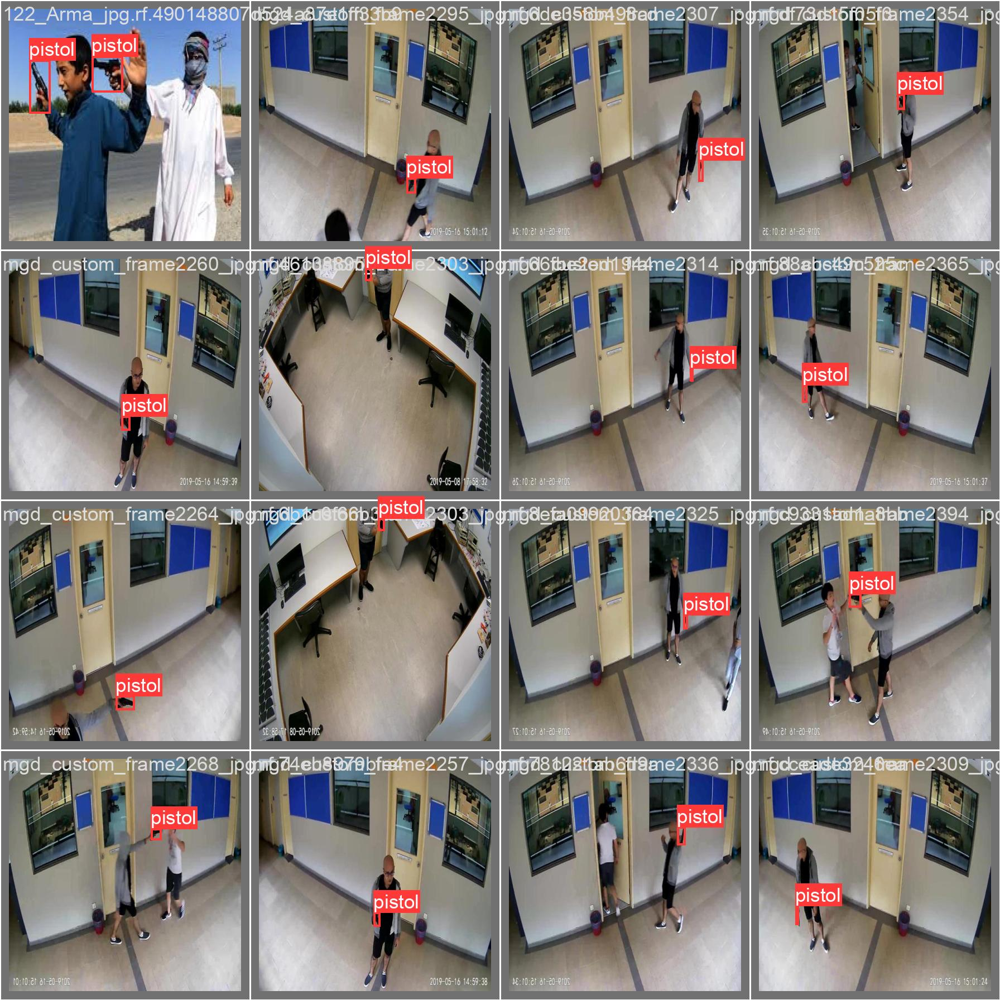

In [ ]:
from IPython.display import Image, clear_output
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

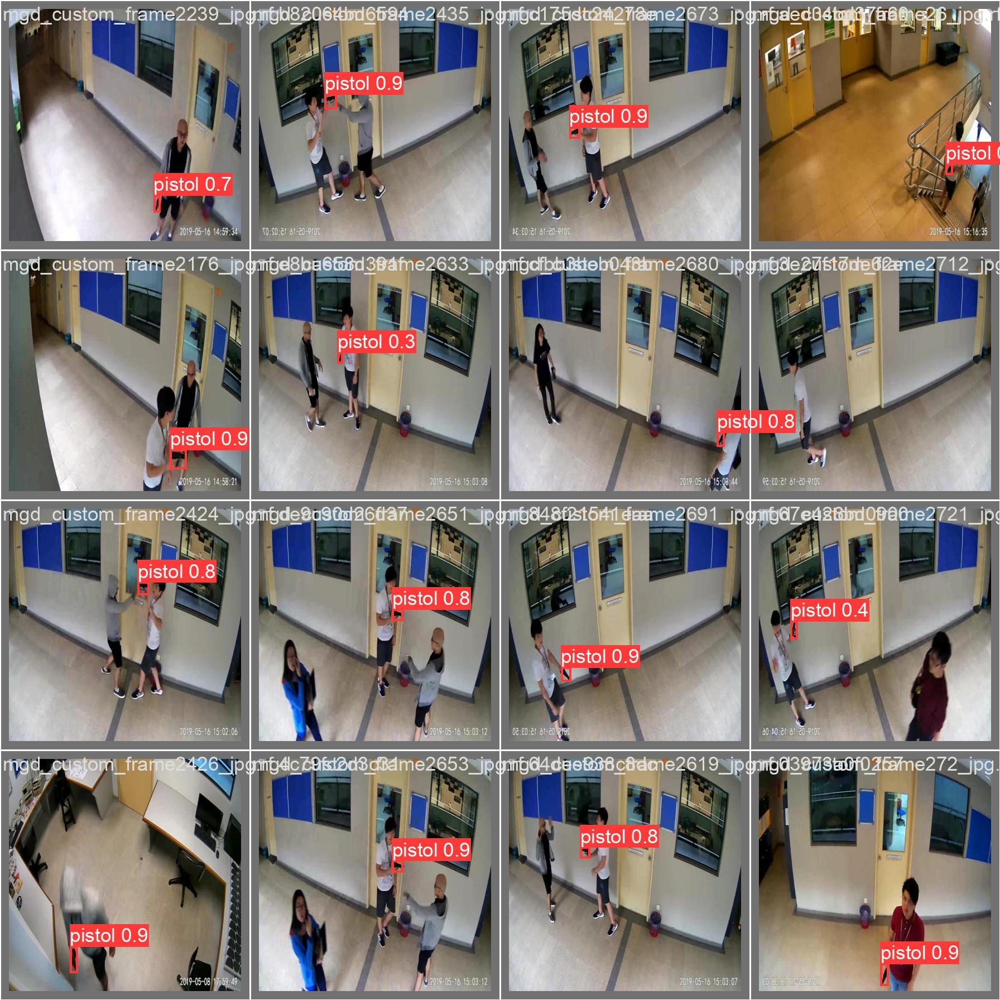

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch1_pred.jpg', width=900)

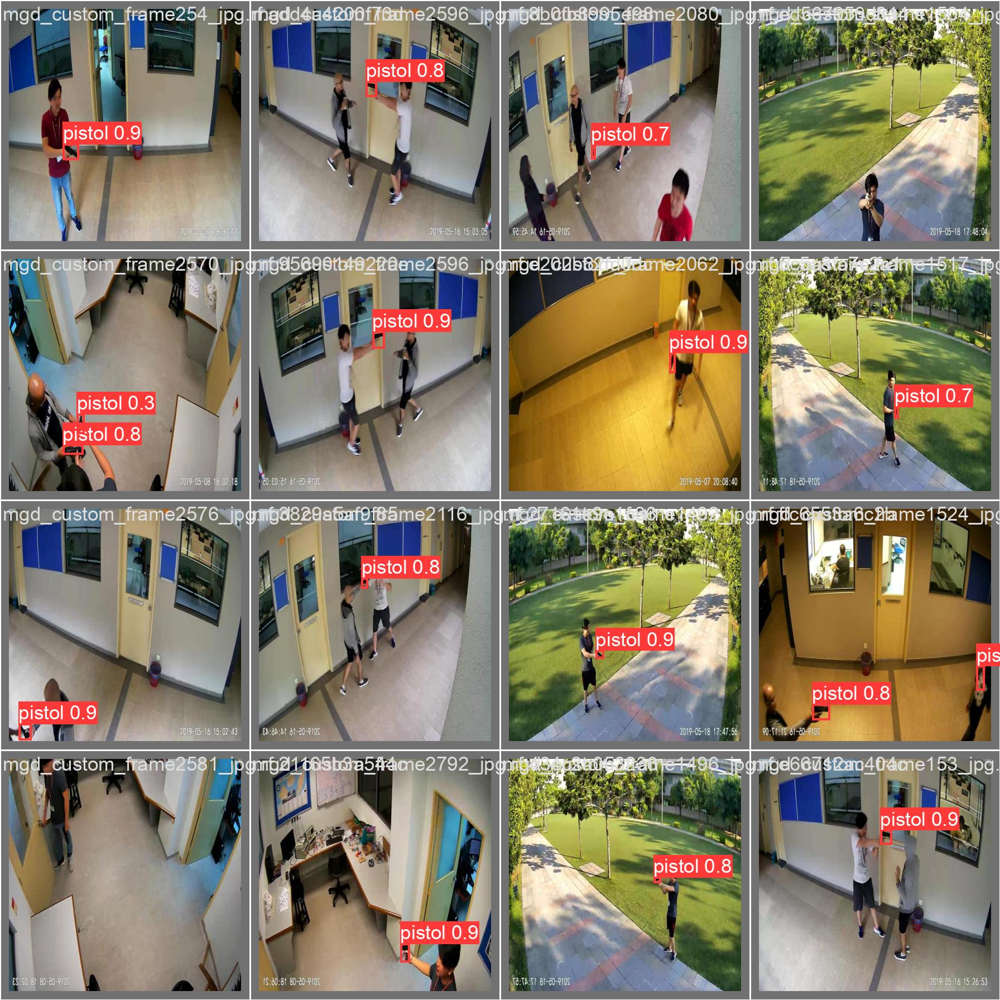

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch2_pred.jpg', width=900)

Evaluate our best model, using unseen data

In [ ]:
!python detect.py --source /content/test/unseen_data --weights /content/best.pt

detect: weights=['/content/best.pt'], source=/content/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-245-g3d8f004 Python-3.10.12 torch-2.1.0+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/6 /content/test/1.jpg: 384x640 2 pistols, 388.7ms
image 2/6 /content/test/2.jpg: 384x640 1 pistol, 366.8ms
image 3/6 /content/test/3.jpg: 384x640 2 pistols, 355.2ms
image 4/6 /content/test/4.jpeg: 448x640 4 pistols, 428.4ms
image 5/6 /content/test/5.jpg: 288x640 1 pistol, 283.3ms
image 6/6 /content/test/6.jpg: 416x640 1 pistol, 396.4ms
Speed: 1.1ms pre-process, 

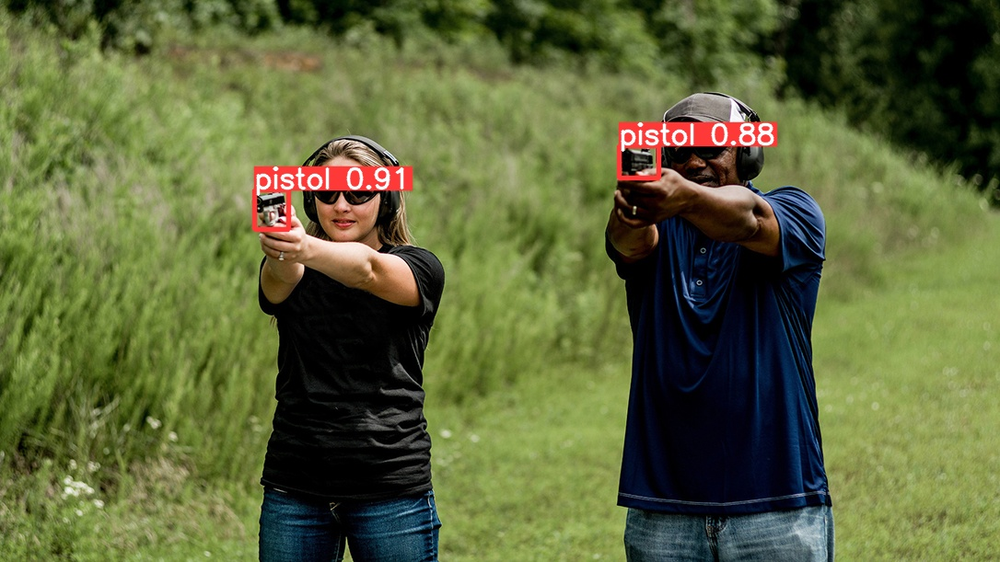

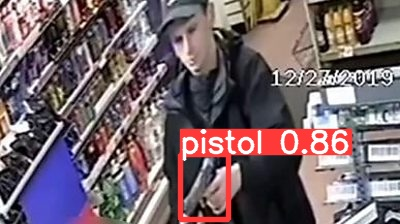

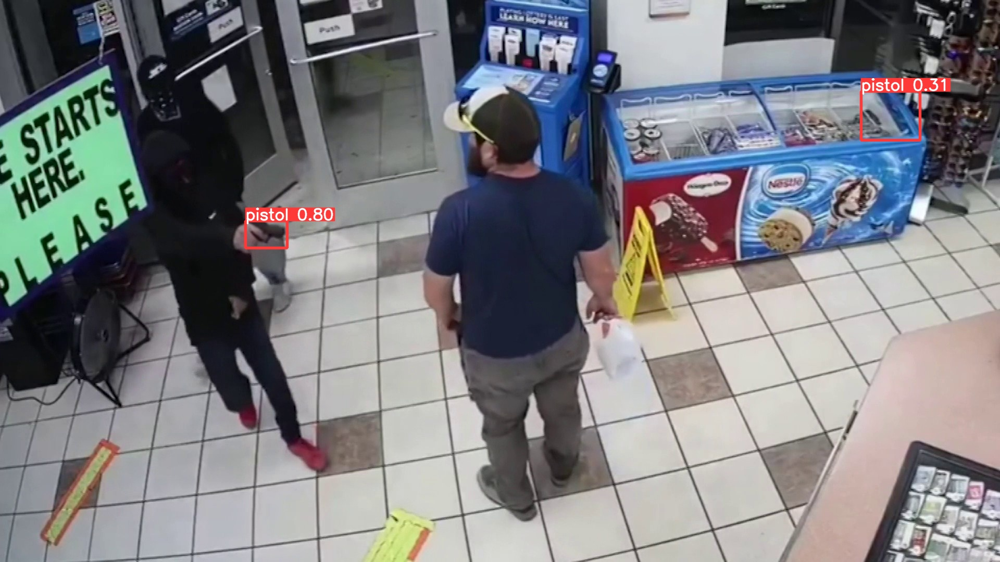

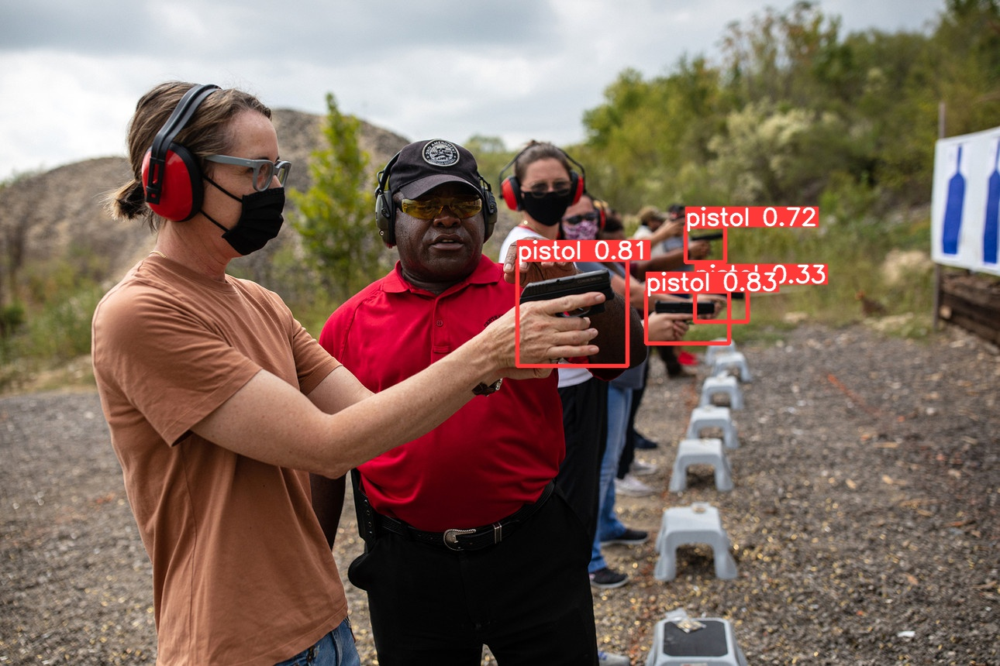

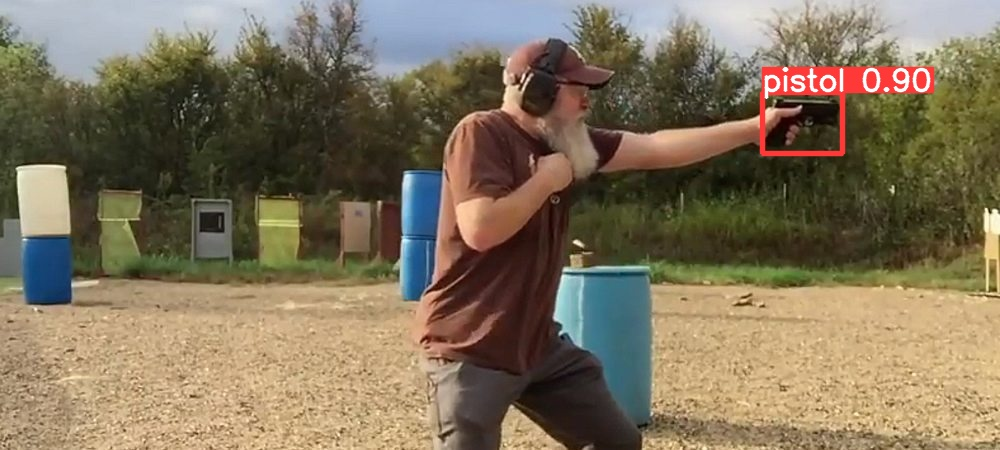

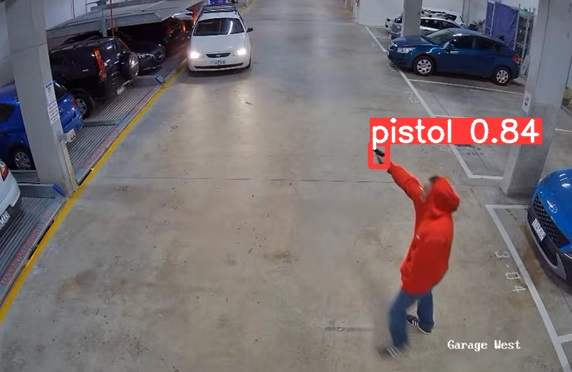

In [ ]:
from IPython.display import display, Image
# Display the images
image_paths = [
    '/content/yolov5/runs/detect/exp2/1.jpg',
    '/content/yolov5/runs/detect/exp2/2.jpg',
    '/content/yolov5/runs/detect/exp2/3.jpg',
    '/content/yolov5/runs/detect/exp2/4.jpeg',
    '/content/yolov5/runs/detect/exp2/5.jpg',
    '/content/yolov5/runs/detect/exp2/6.jpg'
]

for i, img_path in enumerate(image_paths):
    img = Image(filename=img_path)
    display(img)
